In [2]:
using Pkg
using GeometricIntegrators
using Plots
# Pkg.update("AbstractNeuralNetworks")
using AbstractNeuralNetworks

Pkg.status("AbstractNeuralNetworks")
Pkg.status("GeometricIntegrators")

using KernelAbstractions

Pkg.activate("./GeometricMachineLearning.jl")
using GeometricMachineLearning

using CUDA



Status `~/.julia/environments/v1.9/Project.toml`
  [60874f82] AbstractNeuralNetworks v0.1.1
Status `~/.julia/environments/v1.9/Project.toml`
⌃ [dcce2d33] GeometricIntegrators v0.12.1
Info Packages marked with ⌃ have new versions available and may be upgradable.


  Activating project at `/mnt/c/Users/guill/workspace/CEMRACS/Cemracs2023/Guillaume/GeometricMachineLearning.jl`


In [3]:
# using IJulia
# installkernel("Julia (10 threads)", env = Dict("JULIA_NUM_THREADS" => "10"))
# Threads.nthreads()

### Integrator

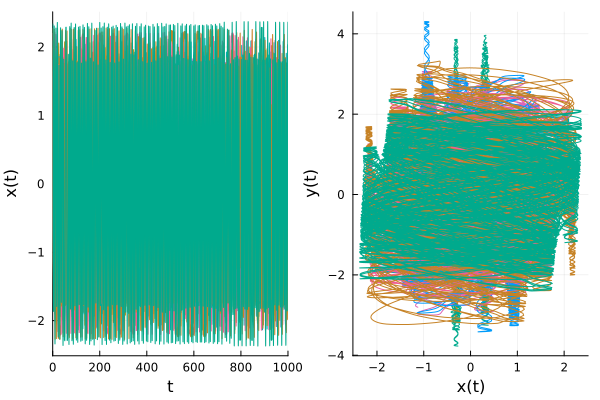

In [4]:
# params = (m1 = [2,3], m2 = [2,3], k1 = [0.1,0.2], k2 =  [0.1,0.2], k =  [0.1,0.2])
params = (m1 = 1, m2 = 2, k1 = 0.1, k2 = 0.1, k = 0.2)

t_integration = 1000

function q̇(v, t, q, p, params)
    v[1] = p[1]/params.m1
    v[2] = p[2]/params.m2
end

function ṗ(f, t, q, p, params)
    f[1] = -params.k1 * q[1] - params.k * (cos(10*q[1]) + 1) * (q[1] - q[2]) + params.k /2 * (q[1] - q[2])^2 * 10 * sin(10 * q[1])
    f[2] = -params.k2 * q[2] + params.k * (cos(10*q[1]) + 1) * (q[1] - q[2]) 
end


p1 = plot(xlims=[0,t_integration], xlab="t", ylab="x(t)", legend=:none)
p2 = plot( xlab="x(t)", ylab="y(t)", legend=:none)

x = Vector{Vector}()
x = []

for x0 in LinRange(0.1, 2, 5) 
    for x1 in LinRange(0.1, 2, 5) 
        params = (m1 = 2, m2 = 2, k1 = 1.5, k2 = 0.1, k = 0.2)
        pode = PODEProblem( q̇, ṗ, (0.0, t_integration), 0.1, [x0,0.4], [x1, 0.4]; parameters = params)
        sol = integrate(pode,ImplicitMidpoint())
        # Add for input and output
        push!(x, [sol.q[:,1], sol.q[:,2], sol.p[:,1], sol.p[:,2]])
        plot!(p1,sol.t, sol.q[:,1])
        plot!(p2, sol.q[:,1], sol.q[:,2])
    end
end

n_params = 25
plot(p1, p2, layout = 2)



In [5]:

@kernel function to_matrix!(matrix, x)
    i,j,k = @index(Global, NTuple)
    matrix[i,j,k] = x[i][j][k]
end
x_matrix = zeros(n_params, 4,t_integration)
kernel! = to_matrix!(CPU())
kernel!(x_matrix, x, ndrange = size(x_matrix))
x_matrix = Float32.(x_matrix)

25×4×1000 Array{Float32, 3}:
[:, :, 1] =
 0.105051  0.419664   0.102029    0.386566
 0.128729  0.419689   0.57415     0.387544
 0.152403  0.419713   1.04613     0.388504
 0.176075  0.419736   1.51802     0.389436
 0.199746  0.419758   1.98984     0.390327
 0.577649  0.420053   0.00596494  0.402112
 0.601342  0.420069   0.478692    0.402742
 0.625039  0.420084   0.951541    0.403348
 0.648738  0.420098   1.42453     0.403918
 0.672442  0.420111   1.89769     0.404442
 1.04999   0.420065  -0.10024     0.402612
 1.07358   0.420103   0.368022    0.404127
 1.09716   0.420144   0.836553    0.405761
 1.12076   0.420187   1.30545     0.407497
 1.14437   0.420233   1.77481     0.409314
 1.52559   0.419954  -0.0763962   0.39817
 1.54901   0.419929   0.385286    0.397175
 1.57239   0.419911   0.845569    0.396454
 1.59574   0.419901   1.30459     0.396025
 1.61906   0.419898   1.76253     0.395902
 2.00219   0.421009  -0.012552    0.44037
 2.02633   0.420927   0.478078    0.437076
 2.05039   0.42

In [6]:

const batch_size = 10
time_steps = Int.(floor.(rand(batch_size)*1000))
params = Int(ceil(rand()*n_params))
@kernel function get_batch!(batch_matrix, input, params, time_steps)
    i,j = @index(Global, NTuple)
    batch_matrix[i,j] = input[params,i,time_steps[j]]
end
input_matrix = zeros(4,batch_size)
output_matrix = zeros(4,batch_size)
kernel! = get_batch!(CPU())
kernel!(input_matrix, x_matrix,params, time_steps, ndrange = size(input_matrix))
kernel!(output_matrix, x_matrix,params, time_steps .+ 1, ndrange = size(input_matrix))

In [7]:
@kernel function get_all_dataset!(ds_input_matrix, input, param)
    i,j = @index(Global, NTuple)
    ds_input_matrix[i,j] = input[j÷1001+1][i][j÷n_params + param]
end
ds_input_matrix = zeros(4, (n_params-1)*(1001)) 
ds_output_matrix = zeros(4, (n_params-1)*(1001)) 
kernel! = get_all_dataset!(CPU())
kernel!(ds_input_matrix, x, 0, ndrange = size(ds_input_matrix))
kernel!(ds_output_matrix, x, 1, ndrange = size(ds_output_matrix))

In [8]:
ds_output_matrix

4×24024 Matrix{Float64}:
 0.105051  0.105051  0.105051  0.105051  …   1.28177     1.28177     1.34037
 0.419664  0.419664  0.419664  0.419664      0.348113    0.348113    1.48217
 0.102029  0.102029  0.102029  0.102029     -3.20872    -3.20872     3.36747
 0.386566  0.386566  0.386566  0.386566     -0.0631559  -0.0631559  -0.702193

### ResNet

In [9]:
using GeometricMachineLearning: ResNet
using Random
using LinearAlgebra
using Zygote
using ProgressMeter
using AbstractNeuralNetworks

model = Chain(ResNet(4, tanh), 
            ResNet(4)
)

ps = initialparameters(CPU(),Float32, model)
model(input_matrix[:,1] , ps)
# apply(model,input_matrix[:,1] |> cu, ps, st)[1]

n_time_steps = t_integration 
const batch_size = 100
n_epochs = 200
opt = Optimizer(AdamOptimizer(), ps)

function loss(ps, x, y)
    norm(model(x, ps) - y)/size(x,2)^(0.5) 
end
println(loss(ps, ds_input_matrix  , ds_output_matrix))

input_matrix = zeros(4,batch_size)
output_matrix = zeros(4,batch_size)

@showprogress "training network" for _ in 1:(n_params * n_time_steps ÷ batch_size*n_epochs)
    time_steps = Int.(floor.(rand(batch_size) * (n_time_steps - 1) .+ 1))
    params = Int(ceil(rand()*n_params ))
    input_matrix = x_matrix[params, :, time_steps]
    output_matrix = x_matrix[params, :, time_steps .+ 1]
    # kernel! = get_batch!(CUDABackend())
    # kernel!(input_matrix, x,params, time_steps |> cu, ndrange = size(input_matrix))
    # kernel!(output_matrix, x,params, time_steps .+ 1, ndrange = size(input_matrix))
    grad = Zygote.gradient(p -> loss(p, input_matrix, output_matrix ), ps)[1]
    optimization_step!(opt, model, ps, grad)
    # println(loss(ps, ds_input_matrix, ds_output_matrix))
end
println(loss(ps, ds_input_matrix  , ds_output_matrix))

2.450357536387946


training network 100%|███████████████████████████████████| Time: 0:00:200:59


0.15476172694235818


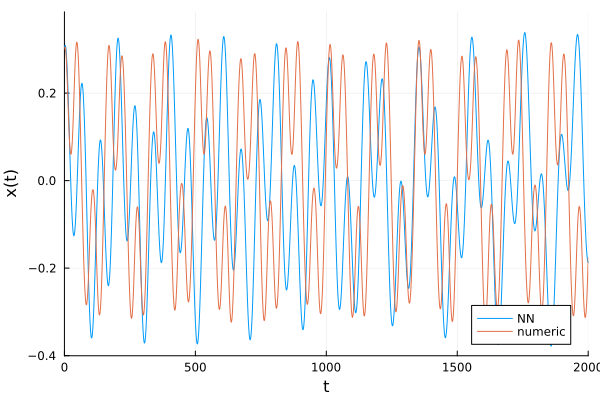

In [11]:
n_int = 2000
xt = [0.3,0.4,0.1,0.4]
x0 = xt
X = (q1 = [], q2 = [], p1 = [], p2 = [])
for t in 1:n_int
    xt = model(xt, ps)
    push!(X.q1, xt[1])
    push!(X.q2, xt[2])
    push!(X.p1, xt[3])
    push!(X.p2, xt[4])
end
params = (m1 = 2, m2 = 2, k1 = 1.5, k2 = 0.1, k = 0.2)
pode = PODEProblem(q̇, ṗ, (0.0, n_int), 0.1, x0[1:2],  x0[3:4]; parameters = params)
sol = integrate(pode,ImplicitMidpoint())
p1 = plot(xlims=[0,n_int], xlab="t", ylab="x(t)", legend=:bottomright)
plot!(p1,X.q1, label="NN")
plot!(p1,sol.q[:,1], label="numeric")

# p1 = plot( xlab="t", ylab="x(t)", legend=:bottomright)
# plot!(p1,sol.q[:,1], sol.q[:,2], label="numeric")
# plot!(p1,X.q1, X.q2, label="model")



### SympNet

In [12]:
model_symp = Chain(Gradient(4,100, tanh; change_q=true),
            Gradient(4,100, tanh; change_q=false),
            Gradient(4,100, tanh; change_q=true),
            Gradient(4,100; change_q=false)
)

ps = initialparameters(CPU(),Float32, model_symp)
model_symp(input_matrix[:,1], ps)

n_time_steps = t_integration
const batch_size = 100
n_epochs = 200
opt = Optimizer(AdamOptimizer(0.001), ps)

function loss(ps, x, y)
    norm(model_symp(x, ps) - y)/size(x,2)^(0.5) 
end
println(loss(ps, ds_input_matrix[:,3], ds_output_matrix[:,3]))

function ds_loss(ps, x, y)
    sum([loss(ps, x[:,i], y[:,i]) for i in 1:size(x)[2]]) / size(x)[2]
end
println(loss(ps,ds_input_matrix, ds_output_matrix ))

input_matrix = zeros(4,batch_size)
output_matrix = zeros(4,batch_size)

@showprogress "training sympnet" for _ in 1:(n_params * n_time_steps ÷ batch_size*n_epochs)
    idx = Int.(floor.(1 * (size(ds_input_matrix)[2] -1)) +1)
    time_steps = Int.(floor.(rand(batch_size) * (n_time_steps - 1) .+ 1))
    params = Int(ceil(rand()*n_params ))
    input_matrix = x_matrix[params, :, time_steps]
    output_matrix = x_matrix[params, :, time_steps .+ 1]
    # kernel! = get_batch!(CPU())
    # kernel!(input_matrix, x,params, time_steps, ndrange = size(input_matrix))
    # kernel!(output_matrix, x,params, time_steps .+ 1, ndrange = size(input_matrix))
    grad = Zygote.gradient(p -> loss(p, input_matrix, output_matrix), ps)[1]
    optimization_step!(opt, model_symp, ps, grad)
    # println(loss(ps, ds_input_matrix, ds_output_matrix))
end
println(ds_loss(ps,ds_input_matrix, ds_output_matrix ))

0.05611310312737933
0.2972117731703817


training sympnet 100%|███████████████████████████████████| Time: 0:02:30:15


0.09040650004807876


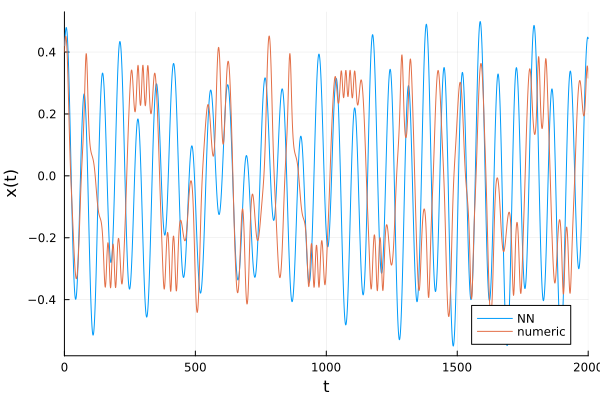

In [13]:
n_int = 2000
xt = [0.4,0.9,0.4,0.]
x0 = xt
X = (q1 = [], q2 = [], p1 = [], p2 = [])
for t in 1:n_int
    xt = model_symp(xt, ps)
    push!(X.q1, xt[1])
    push!(X.q2, xt[2])
    push!(X.p1, xt[3])
    push!(X.p2, xt[4])
end
params = (m1 = 2, m2 = 2, k1 = 1.5, k2 = 0.1, k = 0.2)
pode = PODEProblem(q̇, ṗ, (0.0, n_int), 0.1, x0[1:2],  x0[3:4]; parameters = params)
sol = integrate(pode,ImplicitMidpoint())
p1 = plot( xlab="t", ylab="x(t)", legend=:bottomright)
plot!(p1,sol.q[:,1], sol.q[:,2], label="numeric")
plot!(p1,X.q1, X.q2, label="model")

p2 = plot(xlims=[0,n_int], xlab="t", ylab="x(t)", legend=:bottomright)
plot!(p2,X.q1, label="NN")
plot!(p2,sol.q[:,1], label="numeric")


### Transformer

In [14]:
const n_rolled_steps = 20
const batch_size = 10

time_steps = [Int.(floor.(rand(n_rolled_steps)*1000)) for _ in 1:batch_size]
[time_steps[i] .+ 1 for i in 1:batch_size]
params = Int(ceil(rand()*n_params))


@kernel function get_batch_transformer!(batch_matrix, input, params, time_steps)
    i,j,k = @index(Global, NTuple)
    batch_matrix[i,j,k] = input[params,i,time_steps[k][j]]
end
input_matrix = zeros(Float32,4,n_rolled_steps, batch_size)
output_matrix = zeros(Float32,4,n_rolled_steps, batch_size)
kernel! = get_batch_transformer!(CPU())
kernel!(input_matrix, x_matrix, params, time_steps, ndrange = size(input_matrix))
kernel!(output_matrix, x_matrix, params, [time_steps[i] .+ 1 for i in 1:batch_size], ndrange = size(input_matrix))


LoadError: TaskFailedException

[91m    nested task error: [39mBoundsError: attempt to access 25×4×1000 Array{Float32, 3} at index [4, 1, 0]
    Stacktrace:
     [1] [0m[1mgetindex[22m
    [90m   @[39m [90m./[39m[90m[4messentials.jl:14[24m[39m[90m [inlined][39m
     [2] [0m[1mcpu_get_batch_transformer![22m
    [90m   @[39m [90m~/.julia/packages/KernelAbstractions/cWlFz/src/[39m[90m[4mmacros.jl:276[24m[39m[90m [inlined][39m
     [3] [0m[1mcpu_get_batch_transformer![22m[0m[1m([22m[90m__ctx__[39m::[0mKernelAbstractions.CompilerMetadata[90m{KernelAbstractions.NDIteration.DynamicSize, KernelAbstractions.NDIteration.DynamicCheck, CartesianIndex{3}, CartesianIndices{3, Tuple{Base.OneTo{Int64}, Base.OneTo{Int64}, Base.OneTo{Int64}}}, KernelAbstractions.NDIteration.NDRange{3, KernelAbstractions.NDIteration.DynamicSize, KernelAbstractions.NDIteration.DynamicSize, CartesianIndices{3, Tuple{Base.OneTo{Int64}, Base.OneTo{Int64}, Base.OneTo{Int64}}}, CartesianIndices{3, Tuple{Base.OneTo{Int64}, Base.OneTo{Int64}, Base.OneTo{Int64}}}}}[39m, [90mbatch_matrix[39m::[0mArray[90m{Float32, 3}[39m, [90minput[39m::[0mArray[90m{Float32, 3}[39m, [90mparams[39m::[0mInt64, [90mtime_steps[39m::[0mVector[90m{Vector{Int64}}[39m[0m[1m)[22m
    [90m   @[39m [36mMain[39m [90m./[39m[90m[4mnone:0[24m[39m
     [4] [0m[1m__thread_run[22m[0m[1m([22m[90mtid[39m::[0mInt64, [90mlen[39m::[0mInt64, [90mrem[39m::[0mInt64, [90mobj[39m::[0mKernelAbstractions.Kernel[90m{CPU, KernelAbstractions.NDIteration.DynamicSize, KernelAbstractions.NDIteration.DynamicSize, typeof(cpu_get_batch_transformer!)}[39m, [90mndrange[39m::[0mTuple[90m{Int64, Int64, Int64}[39m, [90miterspace[39m::[0mKernelAbstractions.NDIteration.NDRange[90m{3, KernelAbstractions.NDIteration.DynamicSize, KernelAbstractions.NDIteration.DynamicSize, CartesianIndices{3, Tuple{Base.OneTo{Int64}, Base.OneTo{Int64}, Base.OneTo{Int64}}}, CartesianIndices{3, Tuple{Base.OneTo{Int64}, Base.OneTo{Int64}, Base.OneTo{Int64}}}}[39m, [90margs[39m::[0mTuple[90m{Array{Float32, 3}, Array{Float32, 3}, Int64, Vector{Vector{Int64}}}[39m, [90mdynamic[39m::[0mKernelAbstractions.NDIteration.DynamicCheck[0m[1m)[22m
    [90m   @[39m [35mKernelAbstractions[39m [90m~/.julia/packages/KernelAbstractions/cWlFz/src/[39m[90m[4mcpu.jl:115[24m[39m
     [5] [0m[1m(::KernelAbstractions.var"#18#21"{KernelAbstractions.Kernel{CPU, KernelAbstractions.NDIteration.DynamicSize, KernelAbstractions.NDIteration.DynamicSize, typeof(cpu_get_batch_transformer!)}, Tuple{Int64, Int64, Int64}, KernelAbstractions.NDIteration.NDRange{3, KernelAbstractions.NDIteration.DynamicSize, KernelAbstractions.NDIteration.DynamicSize, CartesianIndices{3, Tuple{Base.OneTo{Int64}, Base.OneTo{Int64}, Base.OneTo{Int64}}}, CartesianIndices{3, Tuple{Base.OneTo{Int64}, Base.OneTo{Int64}, Base.OneTo{Int64}}}}, Tuple{Array{Float32, 3}, Array{Float32, 3}, Int64, Vector{Vector{Int64}}}, KernelAbstractions.NDIteration.DynamicCheck, Int64})[22m[0m[1m([22m[0m[1m)[22m
    [90m   @[39m [35mKernelAbstractions[39m [90m./[39m[90m[4mthreadingconstructs.jl:404[24m[39m

In [26]:
batch_size = t_integration - n_rolled_steps -1
time_steps = [[i+j for j in 1:n_rolled_steps] for i in 1:batch_size]

ds_input_matrix = zeros(Float32,4,n_rolled_steps, batch_size)
ds_output_matrix = zeros(Float32,4,n_rolled_steps, batch_size)
kernel! = get_batch_transformer!(CPU())
kernel!(ds_input_matrix, x_matrix, params, time_steps, ndrange = size(ds_input_matrix))
kernel!(ds_output_matrix, x_matrix, params, [time_steps[i] .+ 1 for i in 1:batch_size], ndrange = size(ds_output_matrix))

In [1]:
model_transformer = Chain(MultiHeadAttention(4, 4, Stiefel=false),
                        ResNet(4, tanh),
                        MultiHeadAttention(4, 4, Stiefel=false),
                        ResNet(4, tanh),
                        MultiHeadAttention(4, 4, Stiefel=false),
                        ResNet(4)
)

# model_transformer = Transformer(4,4,3,Stiefel = false)

ps_transformer = initialparameters(CPU(),Float32, model_transformer)
model_transformer(input_matrix , ps_transformer)

n_time_steps = t_integration
const n_rolled_steps = 20
const batch_size = 100
n_epochs = 120
opt = Optimizer(AdamOptimizer(), ps_transformer)

@kernel function assign_output_kernel!(output, tensor)
    i,j = @index(Global, NTuple)
    output[i,j] = tensor[i,n_rolled_steps, j]
end
assign_output! = assign_output_kernel!(CUDABackend())

function loss(ps, x, y)
    norm(model_transformer(x, ps)[:,n_rolled_steps,:] - y[:,n_rolled_steps,:])/size(x,3)^(0.5) 
end
println(loss(ps_transformer, input_matrix , output_matrix ))


println(loss(ps_transformer, ds_input_matrix , ds_output_matrix ))

input_matrix = zeros(Float32,4,n_rolled_steps,batch_size)
output_matrix = zeros(Float32,4,n_rolled_steps,batch_size)

p = Progress(n_epochs; enabled=true)

for epochs in 1:(n_epochs)
    for _ in 1:n_params * n_time_steps ÷ batch_size
        time_steps = []
        for i in 1:batch_size
            idx = Int.(floor.(rand() * (n_time_steps - n_rolled_steps - 1) ))
            time_step = [i + idx for i in 1:n_rolled_steps]
            push!(time_steps, time_step)
        end
        params = Int(ceil(rand()*n_params))
        kernel! = get_batch_transformer!(CPU())
        kernel!(input_matrix, x_matrix ,params, time_steps, ndrange = size(input_matrix))
        kernel!(output_matrix, x_matrix ,params, [time_steps[i] .+ 1 for i in 1:batch_size], ndrange = size(input_matrix))
        grad = Zygote.gradient(p -> loss(p, input_matrix , output_matrix ), ps_transformer)[1]
        optimization_step!(opt, model_transformer, ps_transformer, grad)
    end
    ProgressMeter.next!(p; showvalues = [(:Loss,loss(ps_transformer, ds_input_matrix, ds_output_matrix))])
end

println(loss(ps_transformer, ds_input_matrix, ds_output_matrix))

LoadError: UndefVarError: `MultiHeadAttention` not defined

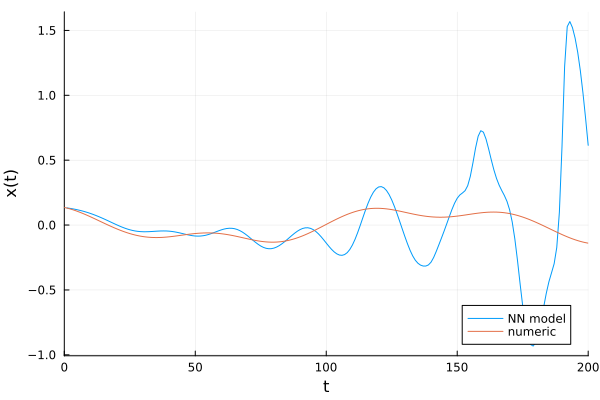

In [133]:
# Constructing 8 time steps to be unrolled for the transformer
n_int = 200
xt = [0.1,0.4,0.1,0.]
params = (m1 = 2, m2 = 2, k1 = 1.5, k2 = 0.1, k = 0.2)
pode = PODEProblem(q̇, ṗ, (0.0, 0.1 * n_rolled_steps), 0.1, xt[1:2],  xt[3:4]; parameters = params)
sol = integrate(pode,ImplicitMidpoint())
x_transformer = []
push!(x_transformer, [sol.q[:,1], sol.q[:,2], sol.p[:,1], sol.p[:,2]])

kernel! = to_matrix!(CPU())
x_transformer_matrix = zeros(1,4,n_rolled_steps)
kernel!(x_transformer_matrix, x_transformer, ndrange = size(x_transformer_matrix))
x_transformer_matrix = Float32.(x_transformer_matrix)

input_matrix = x_transformer_matrix[1,:,1:n_rolled_steps]

# Actual integration for the NN model and the numeric model
xt = input_matrix[:,n_rolled_steps]
X = (q1 = [], q2 = [], p1 = [], p2 = [])
for t in 1:n_int
    output_matrix = model_transformer(input_matrix, ps_transformer)
    push!(X.q1, output_matrix[:,n_rolled_steps][1])
    push!(X.q2, output_matrix[:,n_rolled_steps][2])
    push!(X.p1, output_matrix[:,n_rolled_steps][3])
    push!(X.p2, output_matrix[:,n_rolled_steps][4])
    input_matrix = hcat(input_matrix[:,2:n_rolled_steps] ,output_matrix[:,n_rolled_steps])
end
pode = PODEProblem(q̇, ṗ, (0.0, n_int), 0.1, [Float64(xt[1]), Float64(xt[2])],[Float64(xt[3]), Float64(xt[4])]; parameters = params)
sol = integrate(pode,ImplicitMidpoint())
p1 = plot(xlims=[0,n_int], xlab="t", ylab="x(t)", legend=:bottomright)
plot!(p1,X.q1, label="NN model")
plot!(p1,sol.q[:,1], label="numeric")

In [113]:
Float64(xt[1])

-0.05010730028152466